## INTRODUCTION TO THE DATA


Credit score cards are a common risk control method in the financial industry. It uses personal information and data submitted by credit card applicants to predict the probability of future defaults and credit card borrowings. The bank is able to decide whether to issue a credit card to the applicant. Credit scores can objectively quantify the magnitude of risk. 

**Business Problem:** Banking industries received so many applications for credit card request. Going through each request manually can be very time consuming, also prone to human errors. However, if we can use the historical data to build a model which can shortlist the candidates for approval that can be great.Generally speaking, credit score cards are based on historical data. **The task at hand is to build a machine learning model to predict if an applicant is 'approved' or 'denied'.**

A quick review of the codebook shows that all of the values in the dataset have been converted to meaningless symbols to protect the confidentiality of the data. This will still suit our purposes as a demonstration dataset since we are not using the data to develop actual credit screening criteria. However, to make it easier to work with the dataset, I gave the variables working names based on the type of data.


Releavent Publications:  

**"Simplifying decision trees", Int J Man-Machine Studies 27,
      Dec 1987, pp. 221-234.**
      
**"C4.5: Programs for Machine Learning", Morgan Kaufmann, Oct 1992**


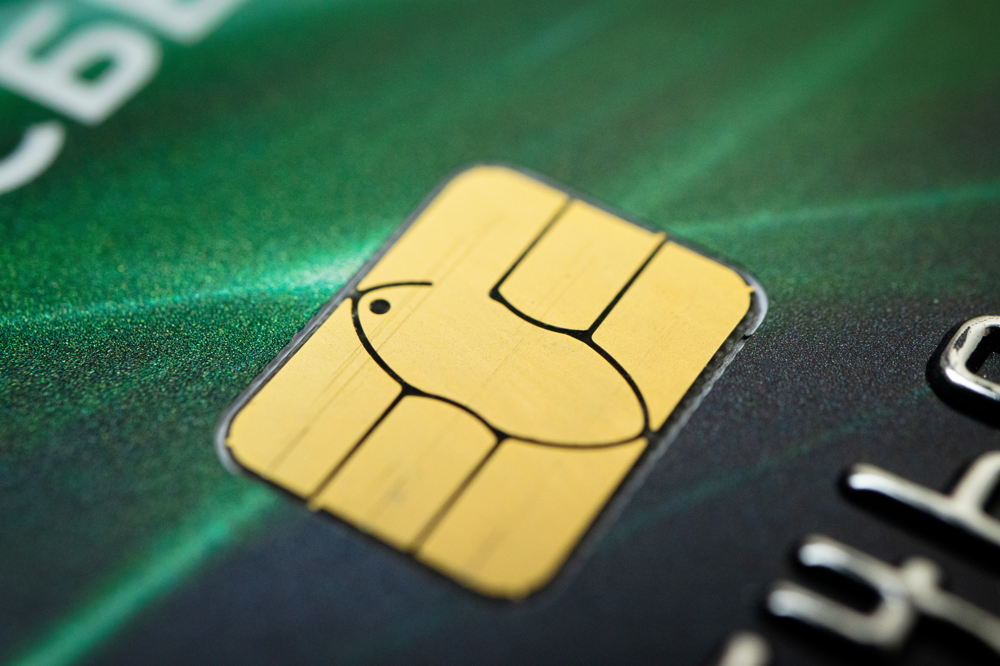

In [296]:
#Import library
from IPython.display import Image
# "C:\Users\laksh\OneDrive\Desktop\Image_ccard.jpg"
# Load image from local storage
Image(filename = "Image_ccard.jpg", width = 600, height = 300)

## 1. Importing Libraries

In [297]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from collections import Counter
from IPython.core.display import display, HTML
sns.set_style('darkgrid')

## 2. A Basic EDA

In [298]:
#reading the data file into the dataframe
ccard_df = pd.read_csv('C:/Users/laksh/OneDrive/Desktop/Credit_card/crx.csv', header=None)

In [299]:
#visuallizing the dataframe
ccard_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,b,30.83,0.000,u,g,w,v,1.25,t,t,1,f,g,202,0,+
1,a,58.67,4.460,u,g,q,h,3.04,t,t,6,f,g,43,560,+
2,a,24.5,0.500,u,g,q,h,1.50,t,f,0,f,g,280,824,+
3,b,27.83,1.540,u,g,w,v,3.75,t,t,5,t,g,100,3,+
4,b,20.17,5.625,u,g,w,v,1.71,t,f,0,f,s,120,0,+


## Inspecting the the dataset(w.r.t. rows and colums):

On the outset the dataset may appear a little abstract and may even appear a bit confusing at its first sight. Here is the first look at the features of a credit card application. The features of this dataset have been anonymized to protect the privacy. A list of common features in a typical credit card application are Gender, Age, Debt, Married, BankCustomer, EducationLevel, Ethnicity, YearsEmployed, PriorDefault, Employed, CreditScore, DriversLicense, Citizen, ZipCode, Income and finally the Approved. This gives us a pretty good starting point, and we can map these features with respect to the columns in the output.

In [300]:
ccard_df.columns = ['Gender', 'Age', 'Debt', 'Married', 'BankCustomer', 'EducationLevel', 'Ethnicity', 'YearsEmployed', 'PriorDefault', 'Employed', 'CreditScore', 'DriversLicense', 'Citizen', 'ZipCode', 'Income', 'Approved']

In [301]:
ccard_df.head(10)

,Gender,Age,Debt,Married,BankCustomer,EducationLevel,Ethnicity,YearsEmployed,PriorDefault,Employed,CreditScore,DriversLicense,Citizen,ZipCode,Income,Approved
0,b,30.83,0.000,u,g,w,v,1.250,t,t,1,f,g,202,0,+
1,a,58.67,4.460,u,g,q,h,3.040,t,t,6,f,g,43,560,+
2,a,24.5,0.500,u,g,q,h,1.500,t,f,0,f,g,280,824,+
3,b,27.83,1.540,u,g,w,v,3.750,t,t,5,t,g,100,3,+
4,b,20.17,5.625,u,g,w,v,1.710,t,f,0,f,s,120,0,+
5,b,32.08,4.000,u,g,m,v,2.500,t,f,0,t,g,360,0,+
6,b,33.17,1.040,u,g,r,h,6.500,t,f,0,t,g,164,31285,+
7,a,22.92,11.585,u,g,cc,v,0.040,t,f,0,f,g,80,1349,+
8,b,54.42,0.500,y,p,k,h,3.960,t,f,0,f,g,180,314,+
9,b,42.5,4.915,y,p,w,v,3.165,t,f,0,t,g,52,1442,+


In [302]:
ccard_df.describe()

,Debt,YearsEmployed,CreditScore,Income
count,690.000000,690.000000,690.00000,690.000000
mean,4.758725,2.223406,2.40000,1017.385507
std,4.978163,3.346513,4.86294,5210.102598
min,0.000000,0.000000,0.00000,0.000000
25%,1.000000,0.165000,0.00000,0.000000
50%,2.750000,1.000000,0.00000,5.000000
75%,7.207500,2.625000,3.00000,395.500000
max,28.000000,28.500000,67.00000,100000.000000


In [303]:
ccard_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 690 entries, 0 to 689
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Gender          690 non-null    object 
 1   Age             690 non-null    object 
 2   Debt            690 non-null    float64
 3   Married         690 non-null    object 
 4   BankCustomer    690 non-null    object 
 5   EducationLevel  690 non-null    object 
 6   Ethnicity       690 non-null    object 
 7   YearsEmployed   690 non-null    float64
 8   PriorDefault    690 non-null    object 
 9   Employed        690 non-null    object 
 10  CreditScore     690 non-null    int64  
 11  DriversLicense  690 non-null    object 
 12  Citizen         690 non-null    object 
 13  ZipCode         690 non-null    object 
 14  Income          690 non-null    int64  
 15  Approved        690 non-null    object 
dtypes: float64(2), int64(2), object(12)
memory usage: 86.4+ KB


In [304]:
ccard_df.shape

(690, 16)

In [305]:
# Print summary statistics
ccard_df_description = ccard_df.describe()
print(ccard_df_description)

print("\n")

             Debt  YearsEmployed  CreditScore         Income
count  690.000000     690.000000    690.00000     690.000000
mean     4.758725       2.223406      2.40000    1017.385507
std      4.978163       3.346513      4.86294    5210.102598
min      0.000000       0.000000      0.00000       0.000000
25%      1.000000       0.165000      0.00000       0.000000
50%      2.750000       1.000000      0.00000       5.000000
75%      7.207500       2.625000      3.00000     395.500000
max     28.000000      28.500000     67.00000  100000.000000




In [306]:
ccard_df.nunique()

Gender              3
Age               350
Debt              215
Married             4
BankCustomer        4
EducationLevel     15
Ethnicity          10
YearsEmployed     132
PriorDefault        2
Employed            2
CreditScore        23
DriversLicense      2
Citizen             3
ZipCode           171
Income            240
Approved            2
dtype: int64

In [307]:
# Count the number of NaNs in the dataset to verify
ccard_df.isnull().sum()

Gender            0
Age               0
Debt              0
Married           0
BankCustomer      0
EducationLevel    0
Ethnicity         0
YearsEmployed     0
PriorDefault      0
Employed          0
CreditScore       0
DriversLicense    0
Citizen           0
ZipCode           0
Income            0
Approved          0
dtype: int64

In [308]:
# Print summary statistics
ccard_df_description = ccard_df.describe()
print(ccard_df_description)

print("\n")

# Print DataFrame information
ccard_df_info = ccard_df.info()
print(ccard_df_info)

print("\n")

             Debt  YearsEmployed  CreditScore         Income
count  690.000000     690.000000    690.00000     690.000000
mean     4.758725       2.223406      2.40000    1017.385507
std      4.978163       3.346513      4.86294    5210.102598
min      0.000000       0.000000      0.00000       0.000000
25%      1.000000       0.165000      0.00000       0.000000
50%      2.750000       1.000000      0.00000       5.000000
75%      7.207500       2.625000      3.00000     395.500000
max     28.000000      28.500000     67.00000  100000.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 690 entries, 0 to 689
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Gender          690 non-null    object 
 1   Age             690 non-null    object 
 2   Debt            690 non-null    float64
 3   Married         690 non-null    object 
 4   BankCustomer    690 non-null    object 
 5   EducationLevel  690 non-

In [309]:
# Inspect missing values in the dataset
print(ccard_df.head(17))

   Gender    Age    Debt Married BankCustomer EducationLevel Ethnicity  \
0       b  30.83   0.000       u            g              w         v   
1       a  58.67   4.460       u            g              q         h   
2       a   24.5   0.500       u            g              q         h   
3       b  27.83   1.540       u            g              w         v   
4       b  20.17   5.625       u            g              w         v   
5       b  32.08   4.000       u            g              m         v   
6       b  33.17   1.040       u            g              r         h   
7       a  22.92  11.585       u            g             cc         v   
8       b  54.42   0.500       y            p              k         h   
9       b   42.5   4.915       y            p              w         v   
10      b  22.08   0.830       u            g              c         h   
11      b  29.92   1.835       u            g              c         h   
12      a  38.25   6.000       u      

In [310]:
ccard_df['Gender'].unique()

array(['b', 'a', '?'], dtype=object)

In [311]:
col_name = ccard_df.columns

In [312]:
col_name = ccard_df.columns
for name in col_name:
    array_unique = ccard_df[name].value_counts()
    array_nunique = ccard_df[name].nunique()
    print('Column Name: {}'.format(name))
    print ('Number of Unique Values: {}'.format(array_nunique))
    print (array_unique)
    

Column Name: Gender
Number of Unique Values: 3
b    468
a    210
?     12
Name: Gender, dtype: int64
Column Name: Age
Number of Unique Values: 350
?        12
22.67     9
20.42     7
20.67     6
23.58     6
         ..
49        1
55.75     1
48.5      1
56.5      1
39.42     1
Name: Age, Length: 350, dtype: int64
Column Name: Debt
Number of Unique Values: 215
1.500     21
0.000     19
3.000     19
2.500     19
0.750     16
          ..
22.290     1
8.460      1
1.290      1
14.585     1
18.500     1
Name: Debt, Length: 215, dtype: int64
Column Name: Married
Number of Unique Values: 4
u    519
y    163
?      6
l      2
Name: Married, dtype: int64
Column Name: BankCustomer
Number of Unique Values: 4
g     519
p     163
?       6
gg      2
Name: BankCustomer, dtype: int64
Column Name: EducationLevel
Number of Unique Values: 15
c     137
q      78
w      64
i      59
aa     54
ff     53
k      51
cc     41
m      38
x      38
d      30
e      25
j      10
?       9
r       3
Name: Educat

## 3. Missing Values

Our dataset contains both numeric and non-numeric data with **float64, int64 and object** datatypes. Specifically, the features Debt, YearsEmployed, CreditScore and Income contain numeric values and of datatypes float64, float64, int64 and int64 respectively and all the other features contain non-numeric values. The **missing values in the dataset are labeled with '?',** which can be seen in the last cell's output. Now, let's temporarily replace these missing value question marks with NaN.

In [313]:
ccard_df = ccard_df.replace('?',np.nan)

In [314]:
#ccard_df['Age'].astype(np.float64)
#ccard_df[["Age"]] > 90
#ccard_df['Age'].max()
ccard_df['Age'] = ccard_df['Age'].astype(float)


In [315]:
ccard_df.head(15)

,Gender,Age,Debt,Married,BankCustomer,EducationLevel,Ethnicity,YearsEmployed,PriorDefault,Employed,CreditScore,DriversLicense,Citizen,ZipCode,Income,Approved
0,b,30.83,0.000,u,g,w,v,1.250,t,t,1,f,g,202,0,+
1,a,58.67,4.460,u,g,q,h,3.040,t,t,6,f,g,43,560,+
2,a,24.50,0.500,u,g,q,h,1.500,t,f,0,f,g,280,824,+
3,b,27.83,1.540,u,g,w,v,3.750,t,t,5,t,g,100,3,+
4,b,20.17,5.625,u,g,w,v,1.710,t,f,0,f,s,120,0,+
5,b,32.08,4.000,u,g,m,v,2.500,t,f,0,t,g,360,0,+
6,b,33.17,1.040,u,g,r,h,6.500,t,f,0,t,g,164,31285,+
7,a,22.92,11.585,u,g,cc,v,0.040,t,f,0,f,g,80,1349,+
8,b,54.42,0.500,y,p,k,h,3.960,t,f,0,f,g,180,314,+
9,b,42.50,4.915,y,p,w,v,3.165,t,f,0,t,g,52,1442,+


In [316]:
# Count the number of NaNs in the dataset to verify
ccard_df.isnull().sum()

Gender            12
Age               12
Debt               0
Married            6
BankCustomer       6
EducationLevel     9
Ethnicity          9
YearsEmployed      0
PriorDefault       0
Employed           0
CreditScore        0
DriversLicense     0
Citizen            0
ZipCode           13
Income             0
Approved           0
dtype: int64

In [317]:
ccard_df.nunique()

Gender              2
Age               349
Debt              215
Married             3
BankCustomer        3
EducationLevel     14
Ethnicity           9
YearsEmployed     132
PriorDefault        2
Employed            2
CreditScore        23
DriversLicense      2
Citizen             3
ZipCode           170
Income            240
Approved            2
dtype: int64

In [318]:
ccard_df.head()

,Gender,Age,Debt,Married,BankCustomer,EducationLevel,Ethnicity,YearsEmployed,PriorDefault,Employed,CreditScore,DriversLicense,Citizen,ZipCode,Income,Approved
0,b,30.83,0.000,u,g,w,v,1.25,t,t,1,f,g,202,0,+
1,a,58.67,4.460,u,g,q,h,3.04,t,t,6,f,g,43,560,+
2,a,24.50,0.500,u,g,q,h,1.50,t,f,0,f,g,280,824,+
3,b,27.83,1.540,u,g,w,v,3.75,t,t,5,t,g,100,3,+
4,b,20.17,5.625,u,g,w,v,1.71,t,f,0,f,s,120,0,+


In [319]:
ccard_df.describe()

,Age,Debt,YearsEmployed,CreditScore,Income
count,678.000000,690.000000,690.000000,690.00000,690.000000
mean,31.568171,4.758725,2.223406,2.40000,1017.385507
std,11.957862,4.978163,3.346513,4.86294,5210.102598
min,13.750000,0.000000,0.000000,0.00000,0.000000
25%,22.602500,1.000000,0.165000,0.00000,0.000000
50%,28.460000,2.750000,1.000000,0.00000,5.000000
75%,38.230000,7.207500,2.625000,3.00000,395.500000
max,80.250000,28.000000,28.500000,67.00000,100000.000000


The missing values in the dataset are labeled with '?' were replaced with NaN previously. Ignoring missing values can affect the performance of a machine learning model heavily. While ignoring the missing values our machine learning model may miss out on information about the dataset that may be useful for its training. Then, there are many models which cannot handle missing values implicitly such as LDA. So, to avoid this problem, we are **going to impute the missing values with a strategy called mean imputation.**

In [320]:
ccard_df.fillna(ccard_df.mean(),  inplace=True)

# Count the number of NaNs in the dataset to verify
ccard_df.isnull().sum()

Gender            12
Age                0
Debt               0
Married            6
BankCustomer       6
EducationLevel     9
Ethnicity          9
YearsEmployed      0
PriorDefault       0
Employed           0
CreditScore        0
DriversLicense     0
Citizen            0
ZipCode           13
Income             0
Approved           0
dtype: int64

In [321]:
ccard_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 690 entries, 0 to 689
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Gender          678 non-null    object 
 1   Age             690 non-null    float64
 2   Debt            690 non-null    float64
 3   Married         684 non-null    object 
 4   BankCustomer    684 non-null    object 
 5   EducationLevel  681 non-null    object 
 6   Ethnicity       681 non-null    object 
 7   YearsEmployed   690 non-null    float64
 8   PriorDefault    690 non-null    object 
 9   Employed        690 non-null    object 
 10  CreditScore     690 non-null    int64  
 11  DriversLicense  690 non-null    object 
 12  Citizen         690 non-null    object 
 13  ZipCode         677 non-null    object 
 14  Income          690 non-null    int64  
 15  Approved        690 non-null    object 
dtypes: float64(3), int64(2), object(11)
memory usage: 86.4+ KB


We have successfully taken care of the missing values present in the numeric columns namely Age, Debt, YearsEmployed, CreditScore and Income. There are still some missing values to be imputed in other non numeric columns Gender, Age, Married, BankCustomer, EducationLevel, Ethinicity and Zipcode. All of these columns contain non-numeric data and this why the mean imputation strategy would not work here. This needs a different treatment.

We are going to impute these **missing values with the most frequent values as present in the respective columns**. This is good practice when it comes to imputing missing values for categorical data in general.

In [322]:
ccard_df.head(10)

,Gender,Age,Debt,Married,BankCustomer,EducationLevel,Ethnicity,YearsEmployed,PriorDefault,Employed,CreditScore,DriversLicense,Citizen,ZipCode,Income,Approved
0,b,30.83,0.000,u,g,w,v,1.250,t,t,1,f,g,202,0,+
1,a,58.67,4.460,u,g,q,h,3.040,t,t,6,f,g,43,560,+
2,a,24.50,0.500,u,g,q,h,1.500,t,f,0,f,g,280,824,+
3,b,27.83,1.540,u,g,w,v,3.750,t,t,5,t,g,100,3,+
4,b,20.17,5.625,u,g,w,v,1.710,t,f,0,f,s,120,0,+
5,b,32.08,4.000,u,g,m,v,2.500,t,f,0,t,g,360,0,+
6,b,33.17,1.040,u,g,r,h,6.500,t,f,0,t,g,164,31285,+
7,a,22.92,11.585,u,g,cc,v,0.040,t,f,0,f,g,80,1349,+
8,b,54.42,0.500,y,p,k,h,3.960,t,f,0,f,g,180,314,+
9,b,42.50,4.915,y,p,w,v,3.165,t,f,0,t,g,52,1442,+


In [323]:
# Iterate over each column
for col in ccard_df:
    # Check if the column is of object type
    if ccard_df[col].dtype == 'object':
        # Impute with the most frequent value
        ccard_df = ccard_df.fillna(ccard_df[col].value_counts().index[0])

# Count the number of NaNs in the dataset and print the counts to verify
print(ccard_df.isna())

     Gender    Age   Debt  Married  BankCustomer  EducationLevel  Ethnicity  \
0     False  False  False    False         False           False      False   
1     False  False  False    False         False           False      False   
2     False  False  False    False         False           False      False   
3     False  False  False    False         False           False      False   
4     False  False  False    False         False           False      False   
..      ...    ...    ...      ...           ...             ...        ...   
685   False  False  False    False         False           False      False   
686   False  False  False    False         False           False      False   
687   False  False  False    False         False           False      False   
688   False  False  False    False         False           False      False   
689   False  False  False    False         False           False      False   

     YearsEmployed  PriorDefault  Employed  CreditS

In [324]:
ccard_df.isnull().sum()

Gender            0
Age               0
Debt              0
Married           0
BankCustomer      0
EducationLevel    0
Ethnicity         0
YearsEmployed     0
PriorDefault      0
Employed          0
CreditScore       0
DriversLicense    0
Citizen           0
ZipCode           0
Income            0
Approved          0
dtype: int64

All the missing values were eliminated with ease.

## 4.Visualization of Data


In [325]:
!pip install plotly
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [326]:
#get the shape of the dataframe
ccard_df.shape

(690, 16)

In [327]:
#get the heatmap of the missing values.
px.imshow(img = ccard_df.isna(), title='Missing values(yellow: missing, blue: not missing)')

## 5.Univariate Analysis

In [342]:
numeric_df = ccard_df[['Age', 'Debt', 'YearsEmployed', 'CreditScore','Income']]
numeric_df.describe()
numeric_df.shape
numeric_df.columns

Index(['Age', 'Debt', 'YearsEmployed', 'CreditScore', 'Income'], dtype='object')

In [343]:
# Extracting our target variable and creating feature list of dependant variables
target = 'Approved'
features_list = list(numeric_df.columns)

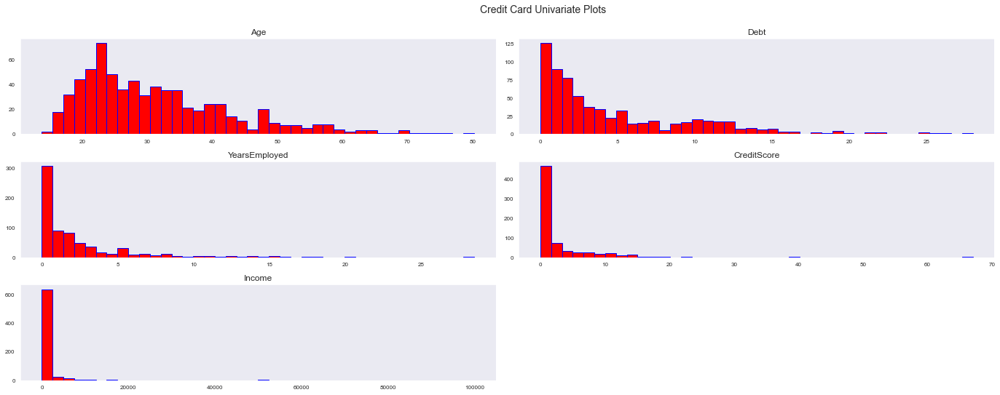

In [344]:
ccard_df[features_list].hist(bins=40, edgecolor='b', linewidth=1.0,
                          xlabelsize=8, ylabelsize=8, grid=False, 
                          figsize=(16,6), color='red')    
plt.tight_layout(rect=(0, 0, 1.2, 1.2))   
plt.suptitle('Credit Card Univariate Plots', x=0.65, y=1.25, fontsize=14);

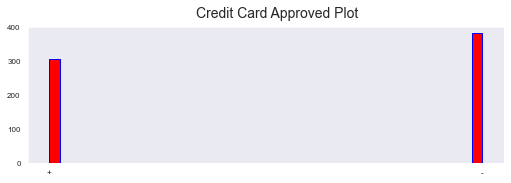

In [347]:
ccard_df[target].hist(bins=40, edgecolor='b', linewidth=1.0,
              xlabelsize=8, ylabelsize=8, grid=False, figsize=(6,2), color='red')    
plt.tight_layout(rect=(0, 0, 1.2, 1.2))   
plt.suptitle('Credit Card Approved Plot', x=0.65, y=1.25, fontsize=14);  

### Density Distribution of Data

C:\Users\laksh\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='Age', ylabel='Density'>

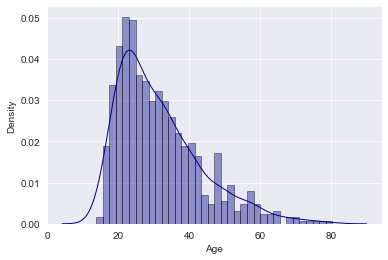

In [271]:
sns.distplot(ccard_df['Age'], hist=True, kde=True, 
             bins=int(180/5), color = 'darkblue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 1})

C:\Users\laksh\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='Debt', ylabel='Density'>

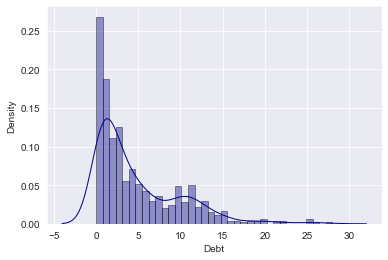

In [272]:
sns.distplot(ccard_df['Debt'], hist=True, kde=True, 
             bins=int(180/5), color = 'darkblue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 1})

C:\Users\laksh\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='YearsEmployed', ylabel='Density'>

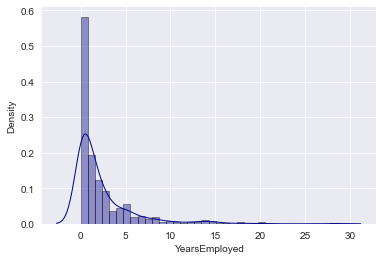

In [273]:
sns.distplot(ccard_df['YearsEmployed'], hist=True, kde=True, 
             bins=int(180/5), color = 'darkblue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 1})

C:\Users\laksh\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='CreditScore', ylabel='Density'>

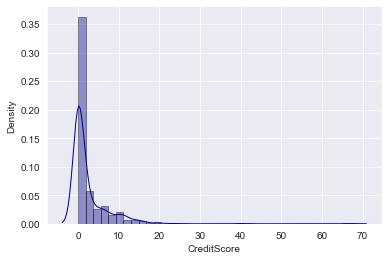

In [274]:
sns.distplot(ccard_df['CreditScore'], hist=True, kde=True, 
             bins=int(180/5), color = 'darkblue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 1})

C:\Users\laksh\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='Income', ylabel='Density'>

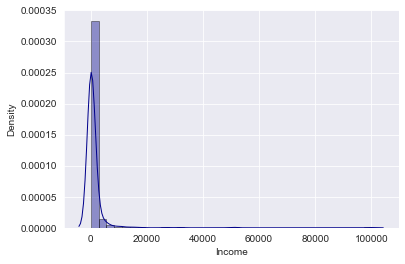

In [275]:
sns.distplot(ccard_df['Income'], hist=True, kde=True, 
             bins=int(180/5), color = 'darkblue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 1})

## 6. Data Preprocessing

The missing values in the data was successfully eliminated but we continue with the data preprocessing step before we proceed with building our machine learning models. We use label encoding to achieve our foreseen result. First we would like to process the non-numeric data to numeric.  We would like to proceed with splitting the data into test and train sets. Then we proceed with feature scaling to a uniform range. 

In [234]:
# Import LabelEncoder
from sklearn.preprocessing import LabelEncoder

# Instantiate LabelEncoder
le = LabelEncoder()

# Iterate over all the values of each column and extract their dtypes
for col in ccard_df:
    # Compare if the dtype is object
    if ccard_df[col].dtype=='object':
    # Use LabelEncoder to do the numeric transformation
        ccard_df[col]=le.fit_transform(ccard_df[col])

In [235]:
ccard_df.head(10)

,Gender,Age,Debt,Married,BankCustomer,EducationLevel,Ethnicity,YearsEmployed,PriorDefault,Employed,CreditScore,DriversLicense,Citizen,ZipCode,Income,Approved
0,1,30.83,0.000,2,1,13,8,1.250,1,1,1,0,0,42,0,0
1,0,58.67,4.460,2,1,11,4,3.040,1,1,6,0,0,118,560,0
2,0,24.50,0.500,2,1,11,4,1.500,1,0,0,0,0,74,824,0
3,1,27.83,1.540,2,1,13,8,3.750,1,1,5,1,0,1,3,0
4,1,20.17,5.625,2,1,13,8,1.710,1,0,0,0,2,8,0,0
5,1,32.08,4.000,2,1,10,8,2.500,1,0,0,1,0,96,0,0
6,1,33.17,1.040,2,1,12,4,6.500,1,0,0,1,0,25,31285,0
7,0,22.92,11.585,2,1,3,8,0.040,1,0,0,0,0,159,1349,0
8,1,54.42,0.500,3,3,9,4,3.960,1,0,0,0,0,34,314,0
9,1,42.50,4.915,3,3,13,8,3.165,1,0,0,1,0,140,1442,0


## 7. Bivariate Analysis

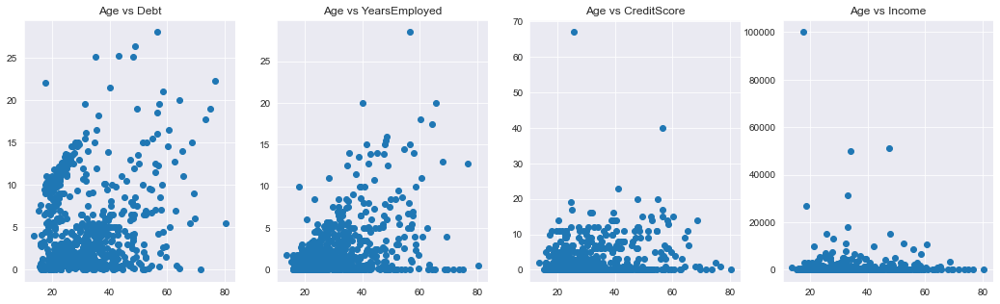

In [278]:
plt.figure(figsize=(18,5))

plt.subplot(1,4,1)
plt.scatter(ccard_df["Age"], ccard_df["Debt"])
plt.title("Age vs Debt")

plt.subplot(1,4,2)
plt.scatter(ccard_df["Age"], ccard_df["YearsEmployed"])
plt.title("Age vs YearsEmployed")

plt.subplot(1,4,3)
plt.scatter(ccard_df["Age"], ccard_df["CreditScore"])
plt.title("Age vs CreditScore")

plt.subplot(1,4,4)
plt.scatter(ccard_df["Age"], ccard_df["Income"])
plt.title("Age vs Income")

plt.show()

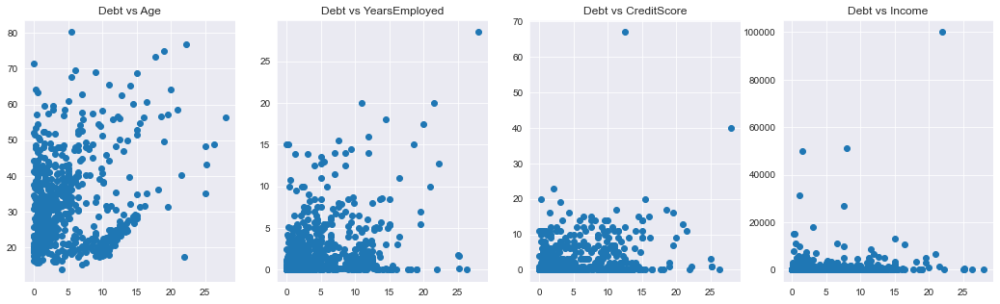

In [280]:
plt.figure(figsize=(18,5))

plt.subplot(1,4,1)
plt.scatter(ccard_df["Debt"], ccard_df["Age"])
plt.title("Debt vs Age")

plt.subplot(1,4,2)
plt.scatter(ccard_df["Debt"], ccard_df["YearsEmployed"])
plt.title("Debt vs YearsEmployed")

plt.subplot(1,4,3)
plt.scatter(ccard_df["Debt"], ccard_df["CreditScore"])
plt.title("Debt vs CreditScore")

plt.subplot(1,4,4)
plt.scatter(ccard_df["Debt"], ccard_df["Income"])
plt.title("Debt vs Income")

plt.show()

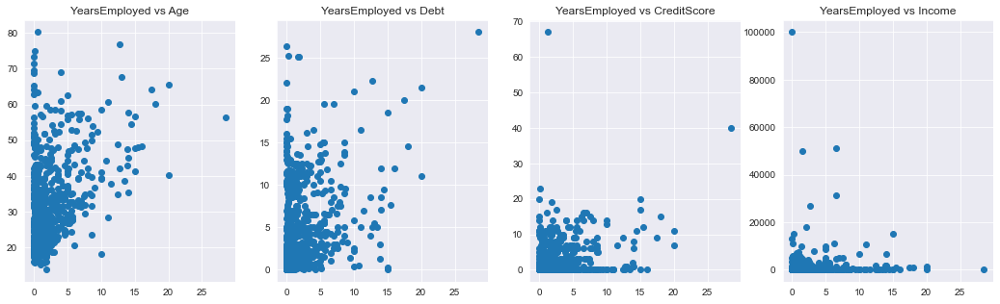

In [281]:
plt.figure(figsize=(18,5))

plt.subplot(1,4,1)
plt.scatter(ccard_df["YearsEmployed"], ccard_df["Age"])
plt.title("YearsEmployed vs Age")

plt.subplot(1,4,2)
plt.scatter(ccard_df["YearsEmployed"], ccard_df["Debt"])
plt.title("YearsEmployed vs Debt")

plt.subplot(1,4,3)
plt.scatter(ccard_df["YearsEmployed"], ccard_df["CreditScore"])
plt.title("YearsEmployed vs CreditScore")

plt.subplot(1,4,4)
plt.scatter(ccard_df["YearsEmployed"], ccard_df["Income"])
plt.title("YearsEmployed vs Income")

plt.show()

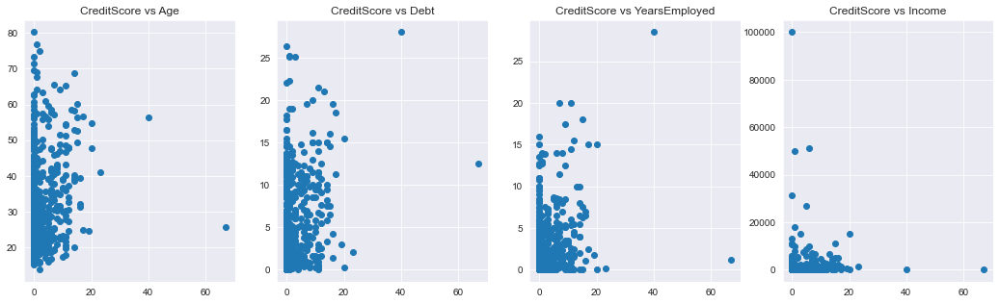

In [283]:
plt.figure(figsize=(18,5))

plt.subplot(1,4,1)
plt.scatter(ccard_df["CreditScore"], ccard_df["Age"])
plt.title("CreditScore vs Age")

plt.subplot(1,4,2)
plt.scatter(ccard_df["CreditScore"], ccard_df["Debt"])
plt.title("CreditScore vs Debt")

plt.subplot(1,4,3)
plt.scatter(ccard_df["CreditScore"], ccard_df["YearsEmployed"])
plt.title("CreditScore vs YearsEmployed")

plt.subplot(1,4,4)
plt.scatter(ccard_df["CreditScore"], ccard_df["Income"])
plt.title("CreditScore vs Income")

plt.show()

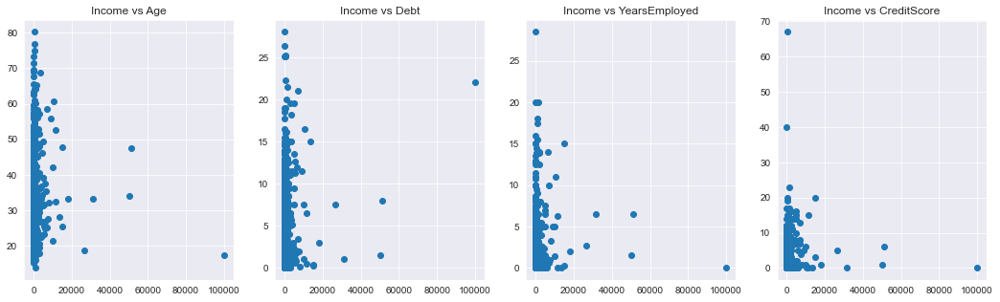

In [284]:
plt.figure(figsize=(18,5))

plt.subplot(1,4,1)
plt.scatter(ccard_df["Income"], ccard_df["Age"])
plt.title("Income vs Age")

plt.subplot(1,4,2)
plt.scatter(ccard_df["Income"], ccard_df["Debt"])
plt.title("Income vs Debt")

plt.subplot(1,4,3)
plt.scatter(ccard_df["Income"], ccard_df["YearsEmployed"])
plt.title("Income vs YearsEmployed")

plt.subplot(1,4,4)
plt.scatter(ccard_df["Income"], ccard_df["CreditScore"])
plt.title("Income vs CreditScore")

plt.show()

## 8.Correlation Coefficient

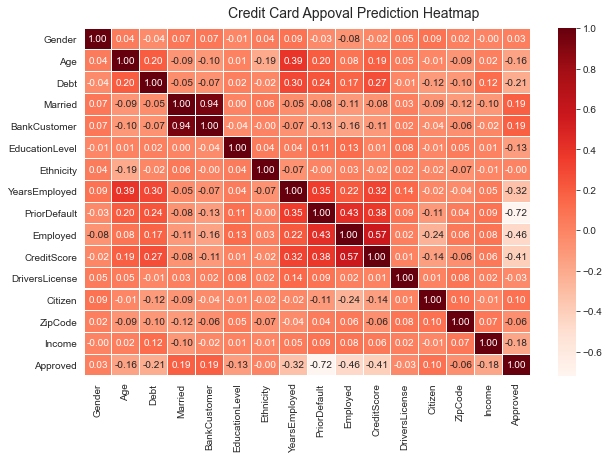

In [236]:
# Get correlation matrix
ccard_df.corr()

# for visualizing correlations
f, ax = plt.subplots(figsize=(10, 6))
corr = ccard_df.corr()
hm = sns.heatmap(round(corr,2), annot=True, ax=ax, cmap="Reds",fmt='.2f',
            linewidths=.05)
f.subplots_adjust(top=0.93)
t= f.suptitle('Credit Card Appoval Prediction Heatmap', fontsize=14)

The most correlated variables with target variables...

    - Aprroved is most correlated with PriorDefault
    
    - Approved is also correlated with CreditScore and Employed

In [178]:
# Import train_test_split_
from sklearn.model_selection import train_test_split

# Drop the features 11 and 13 and convert the DataFrame to a NumPy array
new_df = ccard_df.drop(['DriversLicense', 'ZipCode'], axis=1, inplace=True)
ccard_df = ccard_df.values

# Segregate features and labels into separate variables
X,y = ccard_df[:,0:13] , ccard_df[:,-1]

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,
                                y,
                                test_size=0.3,
                                random_state=42)

In [179]:
# Import MinMaxScaler
from sklearn.preprocessing import MinMaxScaler

# Instantiate MinMaxScaler and use it to rescale X_train and X_test
scaler = MinMaxScaler(feature_range=(0, 1))
rescaledX_train = scaler.fit_transform(X_train)
rescaledX_test = scaler.fit_transform(X_test)

## 9. Machine Learning Models

### (a). Logistic Regression

In [180]:
# Import LogisticRegression
from sklearn.linear_model import LogisticRegression

# Instantiate a LogisticRegression classifier with default parameter values
logreg = LogisticRegression()

# Fit logreg to the trai
logreg.fit(rescaledX_train, y_train)

LogisticRegression()

In [181]:
# Import confusion_matrix
from sklearn.metrics import confusion_matrix

# Use logreg to predict instances from the test set and store it
y_pred = logreg.predict(rescaledX_test)

# Get the accuracy score of logreg model and print it
print("Accuracy of logistic regression classifier: ", logreg.score(rescaledX_test, y_test))

# Print the confusion matrix of the logreg model
print(confusion_matrix(y_test, y_pred))

Accuracy of logistic regression classifier:  0.8357487922705314
[[86 11]
 [23 87]]


In [186]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import confusion_matrix, classification_report
lr = LogisticRegression(solver='lbfgs', penalty='none', max_iter=10000, random_state=2)
lr.fit(X_train, y_train)
lr_predict = lr.predict(X_test)
print(classification_report(y_test, lr_predict))

              precision    recall  f1-score   support

         0.0       0.79      0.87      0.83        97
         1.0       0.87      0.80      0.83       110

    accuracy                           0.83       207
   macro avg       0.83      0.83      0.83       207
weighted avg       0.83      0.83      0.83       207



In [188]:
test_score = lr.score(X_test, y_test)
train_score = lr.score(X_train, y_train)

print('Score on training data: ', train_score)
print('Score on test data: ', test_score)

Score on training data:  0.8757763975155279
Score on test data:  0.8309178743961353


In [190]:
#print confusion matrix and accuracy score
lr_conf_matrix = confusion_matrix(y_test, lr_predict)
lr_acc_score = accuracy_score(y_test, lr_predict)
print(lr_conf_matrix)
print(lr_acc_score*100)

[[84 13]
 [22 88]]
83.09178743961353


In [192]:
lr_regularized = LogisticRegression(solver='lbfgs', penalty='l2', max_iter=10000, random_state=2)
lr_regularized.fit(X_train, y_train)
lr_regularized_predict = lr_regularized.predict(X_test)
print(classification_report(y_test, lr_regularized_predict))

              precision    recall  f1-score   support

         0.0       0.80      0.89      0.84        97
         1.0       0.89      0.80      0.84       110

    accuracy                           0.84       207
   macro avg       0.84      0.84      0.84       207
weighted avg       0.85      0.84      0.84       207



In [250]:
#print confusion matrix and accuracy score
lr_conf_matrix = confusion_matrix(y_test, lr_regularized_predict)
lr_acc_score_2 = accuracy_score(y_test, lr_regularized_predict)
print(lr_conf_matrix)
print(lr_acc_score_2*100)

[[86 11]
 [22 88]]
84.05797101449275


### (b). Decision Tree

In [195]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()
dt.fit(X_train,y_train)
dt_predict = dt.predict(X_test)
print(classification_report(y_test, dt_predict))

              precision    recall  f1-score   support

         0.0       0.88      0.78      0.83        97
         1.0       0.83      0.91      0.87       110

    accuracy                           0.85       207
   macro avg       0.86      0.85      0.85       207
weighted avg       0.85      0.85      0.85       207



In [196]:
#print confusion matrix and accuracy score
dt_conf_matrix = confusion_matrix(y_test, dt_predict)
dt_acc_score = accuracy_score(y_test, dt_predict)
print(dt_conf_matrix)
print(dt_acc_score*100)

[[ 76  21]
 [ 10 100]]
85.02415458937197


In [136]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier(criterion = 'entropy', max_depth = None, min_samples_split = 3,)
dt.fit(X_train,y_train)
dt_predict = dt.predict(x_test)
print(classification_report(y_test, dt_predict))

In [197]:
#print confusion matrix and accuracy score
dt_conf_matrix = confusion_matrix(y_test, dt_predict)
dt_acc_score_2 = accuracy_score(y_test, dt_predict)
print(dt_conf_matrix)
print(dt_acc_score_2*100)

[[ 76  21]
 [ 10 100]]
85.02415458937197


Feature: Gender, Score: 0.0
Feature: Age, Score: 0.048264271283927664
Feature: Debt, Score: 0.0787722810697142
Feature: Married, Score: 0.028760062058550622
Feature: BankCustomer, Score: 0.015674577523317013
Feature: EducationLevel, Score: 0.055499120143980896
Feature: Ethnicity, Score: 0.031284556375741804
Feature: YearsEmployed, Score: 0.08588100577988915
Feature: PriorDefault, Score: 0.5357939339875111
Feature: Employed, Score: 0.0
Feature: CreditScore, Score: 0.04675136116152452
Feature: DriversLicense, Score: 0.01740734755440638
Feature: Citizen, Score: 0.05591148306143664


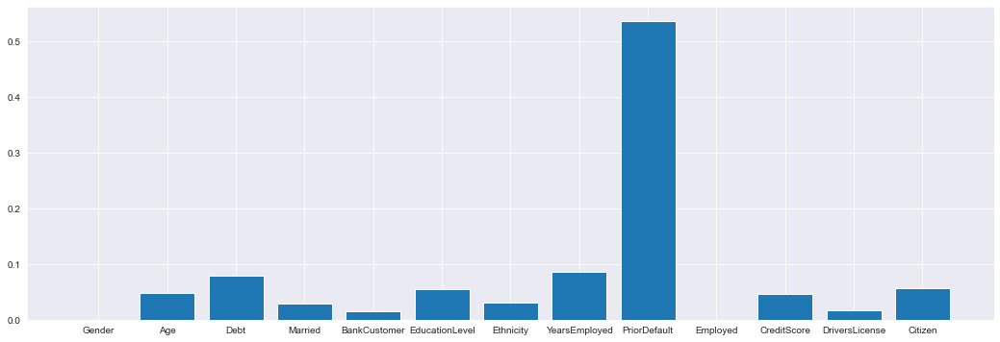

In [286]:
# get importance
importance = dt.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
 #print('Feature: %0d, Score: %.5f' % (i,v))
 print('Feature: {0}, Score: {1}'.format(col_name[i], v))
# plot feature importance
plt.figure(figsize=(18,6))
plt.bar([col_name[i] for i in range(len(importance))], importance)
plt.show()

### (c). Random Forest Classifier

from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
rf_predict=rf.predict(X_test)
print(classification_report(y_test, rf_predict))

In [199]:
#print confusion matrix and accuracy score
rf_conf_matrix = confusion_matrix(y_test, rf_predict)
rf_acc_score = accuracy_score(y_test, rf_predict)
print(rf_conf_matrix)
print(rf_acc_score*100)

[[80 17]
 [13 97]]
85.5072463768116


Feature: Gender, Score: 0.015621519965733466
Feature: Age, Score: 0.0962019359363034
Feature: Debt, Score: 0.09161065274604224
Feature: Married, Score: 0.016338557325673936
Feature: BankCustomer, Score: 0.01348065244047405
Feature: EducationLevel, Score: 0.062482560211520176
Feature: Ethnicity, Score: 0.03174379076443309
Feature: YearsEmployed, Score: 0.11499299333210024
Feature: PriorDefault, Score: 0.2962844831052508
Feature: Employed, Score: 0.04537707874352421
Feature: CreditScore, Score: 0.10131191544246052
Feature: DriversLicense, Score: 0.008205648106520327
Feature: Citizen, Score: 0.1063482118799636


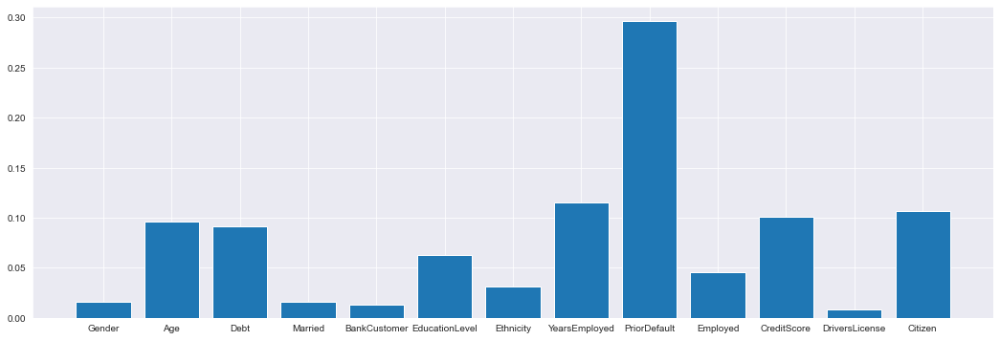

In [285]:
# get importance
importance = rf.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
 #print('Feature: %0d, Score: %.5f' % (i,v))
 print('Feature: {0}, Score: {1}'.format(col_name[i], v))
# plot feature importance
plt.figure(figsize=(18,6))
plt.bar([col_name[i] for i in range(len(importance))], importance)
plt.show()

### (d). Stochastic Grdient Descent

In [238]:
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import confusion_matrix, classification_report
sgd = SGDClassifier(penalty=None)
sgd.fit(X_train, y_train)
sgd_predict = sgd.predict(X_test)
print(classification_report(y_test, sgd_predict))

              precision    recall  f1-score   support

         0.0       0.63      0.67      0.65        97
         1.0       0.69      0.65      0.67       110

    accuracy                           0.66       207
   macro avg       0.66      0.66      0.66       207
weighted avg       0.66      0.66      0.66       207



In [239]:
sgd_conf_matrix = confusion_matrix(y_test, sgd_predict)
sgd_acc_score_1 = accuracy_score(y_test, sgd_predict)
print(sgd_conf_matrix)
print(sgd_acc_score_1*100)

[[65 32]
 [38 72]]
66.18357487922705


### (e). KNN

In [290]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
knn_predict = knn.predict(X_test)
print(classification_report(y_test, knn_predict))

              precision    recall  f1-score   support

         0.0       0.72      0.56      0.63        97
         1.0       0.67      0.81      0.74       110

    accuracy                           0.69       207
   macro avg       0.70      0.68      0.68       207
weighted avg       0.70      0.69      0.69       207



In [291]:
knn_conf_matrix = confusion_matrix(y_test, knn_predict)
knn_acc_score = accuracy_score(y_test, knn_predict)
print(knn_conf_matrix)
print(knn_acc_score*100)

[[54 43]
 [21 89]]
69.08212560386472


In [253]:
models = [('Logistic Regression', lr_acc_score),
          ('Decision Trees', dt_acc_score_2),
          ('Random Forest', rf_acc_score),
          ('Stochastic Gradient Descent', sgd_acc_score_1),
          ('KNN', knn_acc_score)
         ]

In [254]:
accuracy_vis_pd = pd.DataFrame(data = models, columns=['Model', 'Accuracy(test)'])
accuracy_vis_pd

,Model,Accuracy(test)
0,Logistic Regression,0.840580
1,Decision Trees,0.850242
2,Random Forest,0.855072
3,Stochastic Gradient Descent,0.661836
4,KNN,0.690821


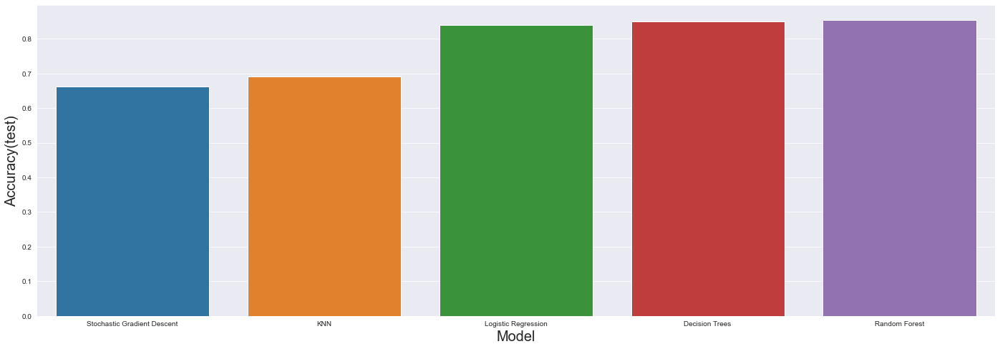

In [247]:
accuracy_vis_pd.sort_values(by=(['Accuracy(test)']), ascending=True, inplace=True)

f, axe = plt.subplots(1,1, figsize=(24,8))
sns.barplot(x = 'Model', y='Accuracy(test)',data = accuracy_vis_pd, ax = axe)
axe.set_xlabel('Model', size=20)
axe.set_ylabel('Accuracy(test)', size=20)

plt.show()

### Prior Default Vs Approved

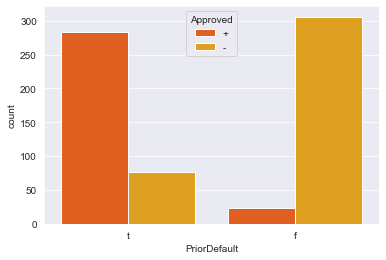

In [354]:
sns.countplot(x="PriorDefault", hue="Approved", data=ccard_df, palette="autumn")
plt.show()

## The top three machine learning models for the current dataset are the following
                - 1.Logistic Regression
                - 2.Random Forest
                - 3.Decision Trees

## 10. Conclusions:
 
- The credit card approval data was wrangled with various methods
- It was found that approval status of the applicant is mostly correlated to PriorDefault and YearsEmployed
- Data was split into training and test set. Machine learning models were trained in training set and tested for accuracy on the test   set.
- Logistic Regression, Random Forest and Decision Trees were the top 3 ML models with an accuracy of 86%
- Machine learning also conclude that “PriorDefault” and "YearsEmployed" are the most important variable that determines the approval of credit card



## 11. Future Scope:

- ML models accuracy is not high. A larger datset with more information on the applicants will aid better prediction.
- Lack of information about how the dataset was created may impact the prediction of approval status using only the generalized applicant data as predictors. 